In [1]:
# Ignore  the warnings
import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

# data visualisation and manipulation
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import style
import seaborn as sns
 
#configure
# sets matplotlib to inline and displays graphs below the corressponding cell.
%matplotlib inline  
style.use('fivethirtyeight')
sns.set(style='whitegrid',color_codes=True)

#model selection
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score,precision_score,recall_score,confusion_matrix,roc_curve,roc_auc_score
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import LabelEncoder

#preprocess.
from keras.preprocessing.image import ImageDataGenerator

#dl libraraies
from keras import backend as K
from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import Adam,SGD,Adagrad,Adadelta,RMSprop
from keras.utils import to_categorical

# specifically for cnn
from keras.layers import Dropout, Flatten,Activation
from keras.layers import Conv2D, MaxPooling2D, BatchNormalization
 
import tensorflow as tf
import random as rn

# specifically for manipulating zipped images and getting numpy arrays of pixel values of images.
import cv2                  
import numpy as np  
from tqdm import tqdm
import os                   
from random import shuffle  
from zipfile import ZipFile
from PIL import Image

Using TensorFlow backend.


# Data load

In [2]:
X=[]
Z=[]
IMG_SIZE=48
FREE_DIR='/Users/abishekganapathy/Desktop/IP/Training/empty'
FULL_DIR='/Users/abishekganapathy/Desktop/IP/Training/occupied'

In [3]:
def assign_label(img,label):
    return label

In [4]:
def make_train_data(label,DIR):
    for img in tqdm(os.listdir(DIR)):
        label=assign_label(img,label)
        path = os.path.join(DIR,img)
        img = cv2.imread(path,cv2.IMREAD_COLOR)
        img = cv2.resize(img, (IMG_SIZE,IMG_SIZE))
        
        X.append(np.array(img))
        Z.append(str(label))

In [5]:
# make 'Free' data
make_train_data('Free',FREE_DIR)
print(len(X))

100%|██████████| 96/96 [00:00<00:00, 1389.85it/s]

96


In [6]:
# make 'Full' data
make_train_data('Full',FULL_DIR)
print(len(X))

100%|██████████| 285/285 [00:00<00:00, 1323.94it/s]

381


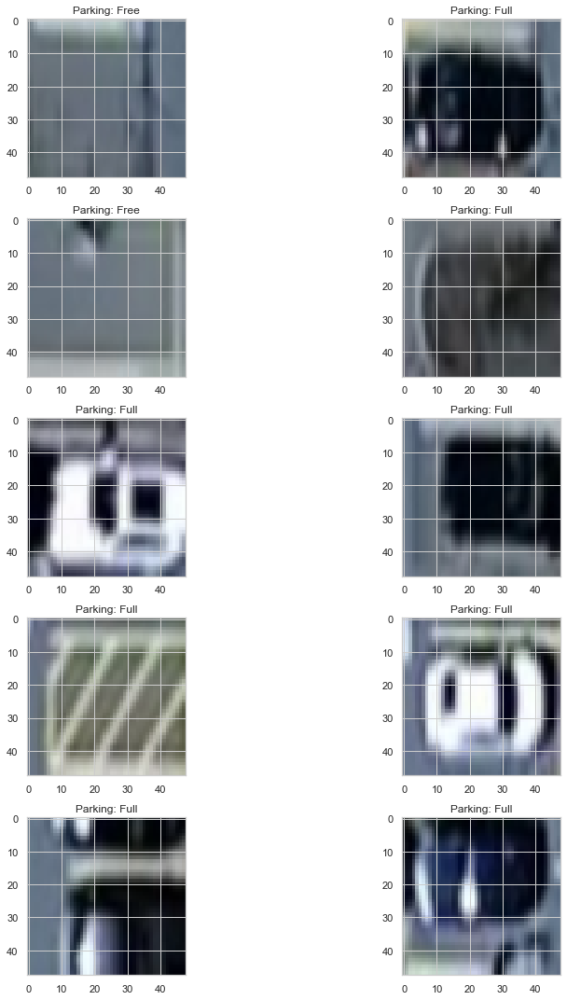

In [7]:
# check some image
fig,ax=plt.subplots(5,2)
fig.set_size_inches(15,15)
for i in range(5):
    for j in range (2):
        l=rn.randint(0,len(Z))
        ax[i,j].imshow(X[l])
        ax[i,j].set_title('Parking: '+Z[l])
        
plt.tight_layout()

In [8]:
le=LabelEncoder()
Y=le.fit_transform(Z)
Y=to_categorical(Y,2)
X=np.array(X)
X=X/255

In [9]:
# separate data
x_train,x_test,y_train,y_test=train_test_split(X,Y,test_size=0.25,random_state=42)

In [10]:
# fix random seed
np.random.seed(42)
rn.seed(42)
tf.random.set_seed(42)

# Build model

In [11]:
# # modelling starts using a CNN.

model = Sequential()
model.add(Conv2D(filters = 32, kernel_size = (5,5),padding = 'Same',activation ='relu', input_shape = (48,48,3)))
model.add(MaxPooling2D(pool_size=(2,2)))


model.add(Conv2D(filters = 64, kernel_size = (3,3),padding = 'Same',activation ='relu'))
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))
 

model.add(Conv2D(filters =96, kernel_size = (3,3),padding = 'Same',activation ='relu'))
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))

model.add(Conv2D(filters = 96, kernel_size = (3,3),padding = 'Same',activation ='relu'))
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))

model.add(Flatten())
model.add(Dense(512))
model.add(Activation('relu'))
model.add(Dense(2, activation = "softmax"))

In [12]:
batch_size=128
epochs=50

# use callback only ReduceLROnPlateau
from keras.callbacks import ReduceLROnPlateau
red_lr= ReduceLROnPlateau(monitor='val_acc',patience=3,verbose=1,factor=0.1)

In [13]:
# data augmentation to prevent overfitting
datagen = ImageDataGenerator(
        featurewise_center=False,  # set input mean to 0 over the dataset
        samplewise_center=False,  # set each sample mean to 0
        featurewise_std_normalization=False,  # divide inputs by std of the dataset
        samplewise_std_normalization=False,  # divide each input by its std
        zca_whitening=False,  # apply ZCA whitening
        rotation_range=10,  # randomly rotate images in the range (degrees, 0 to 180)
        zoom_range = 0.1, # Randomly zoom image 
        width_shift_range=0.2,  # randomly shift images horizontally (fraction of total width)
        height_shift_range=0.2,  # randomly shift images vertically (fraction of total height)
        horizontal_flip=True,  # randomly flip images
        vertical_flip=False)  # randomly flip images


datagen.fit(x_train)

In [14]:
model.compile(optimizer=Adam(lr=0.001),loss='categorical_crossentropy',metrics=['accuracy'])

In [15]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 48, 48, 32)        2432      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 24, 24, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 24, 24, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 12, 12, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 12, 12, 96)        55392     
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 6, 6, 96)          0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 6, 6, 96)         

# Train

In [16]:
History = model.fit_generator(datagen.flow(x_train,y_train, batch_size=batch_size),
                              epochs = epochs, validation_data = (x_test,y_test),
                              verbose = 1, steps_per_epoch=x_train.shape[0] // batch_size,callbacks=[red_lr])

Epoch 1/50
2/2 [==============================] - 2s 1s/step - loss: 0.6225 - accuracy: 0.5195 - val_loss: 0.8245 - val_accuracy: 0.6458
Epoch 2/50
2/2 [==============================] - 0s 149ms/step - loss: 0.4938 - accuracy: 0.8103 - val_loss: 0.6734 - val_accuracy: 0.6458
Epoch 3/50
2/2 [==============================] - 1s 309ms/step - loss: 0.4744 - accuracy: 0.7812 - val_loss: 0.5992 - val_accuracy: 0.6458
Epoch 4/50
2/2 [==============================] - 0s 219ms/step - loss: 0.4607 - accuracy: 0.7771 - val_loss: 0.5553 - val_accuracy: 0.6458
Epoch 5/50
2/2 [==============================] - 1s 304ms/step - loss: 0.4031 - accuracy: 0.7734 - val_loss: 0.4828 - val_accuracy: 0.6458
Epoch 6/50
2/2 [==============================] - 0s 216ms/step - loss: 0.3012 - accuracy: 0.8025 - val_loss: 0.4142 - val_accuracy: 0.6458
Epoch 7/50
2/2 [==============================] - 1s 289ms/step - loss: 0.2682 - accuracy: 0.7852 - val_loss: 0.3760 - val_accuracy: 0.6458
Epoch 8/50
2/2 [=======

# Evaluate model

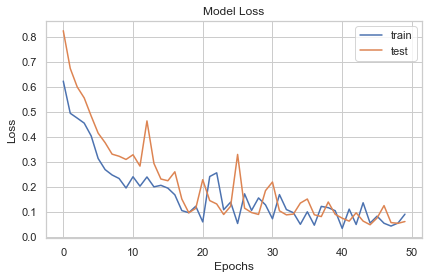

In [17]:
#Loss Curve

plt.plot(History.history['loss'])
plt.plot(History.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['train', 'test'])
plt.show()

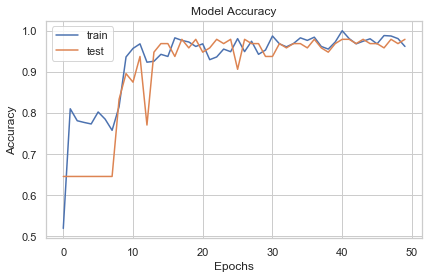

In [18]:
#Accuracy Curve

plt.plot(History.history['accuracy'])
plt.plot(History.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['train', 'test'])
plt.show()

In [19]:
# getting predictions on val set.
pred=model.predict(x_test)
pred_digits=np.argmax(pred,axis=1)

In [20]:
# now storing some correctly as well as misclassified indexes'.
i=0
prop_class=[]
mis_class=[]
for i in range(len(y_test)):
    if(np.argmax(y_test[i])==pred_digits[i]):
        prop_class.append(i)
    if(len(prop_class)==8):
        break

i=0
for i in range(len(y_test)):
    if(not np.argmax(y_test[i])==pred_digits[i]):
        mis_class.append(i)
    if(len(mis_class)==8):
        break

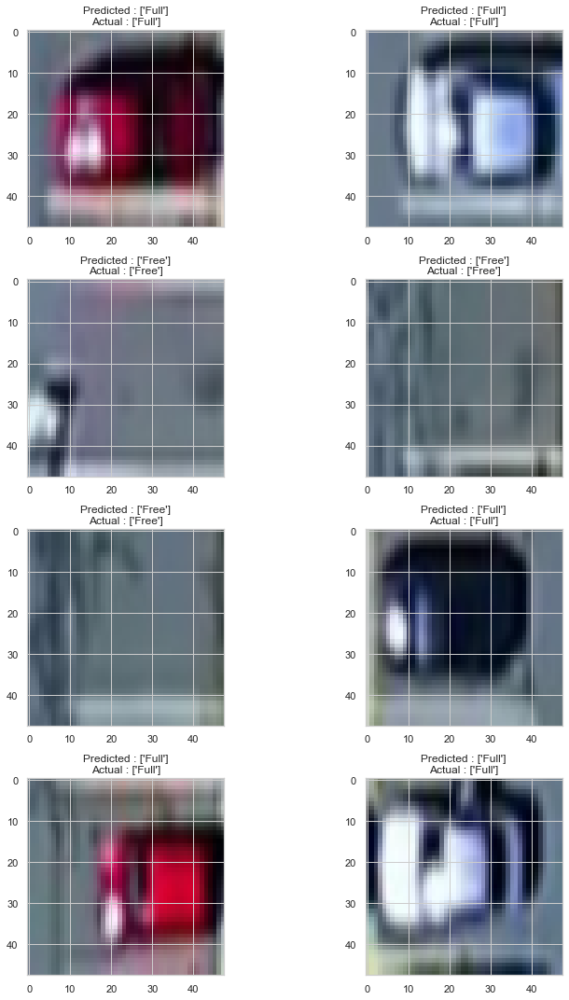

In [21]:
#Used for displaying the correctly classified images

warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

count=0
fig,ax=plt.subplots(4,2)
fig.set_size_inches(15,15)
for i in range (4):
    for j in range (2):
        ax[i,j].imshow(x_test[prop_class[count]])
        ax[i,j].set_title("Predicted : "+str(le.inverse_transform([pred_digits[prop_class[count]]]))+"\n"+"Actual : "+str(le.inverse_transform([np.argmax([y_test[prop_class[count]]])])))
        plt.tight_layout()
        count+=1

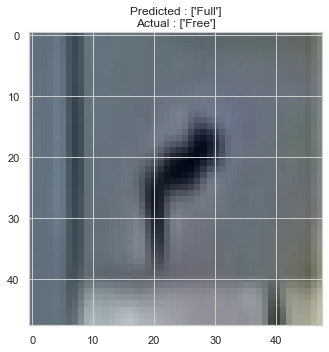

In [38]:
#Used for displaying the misclassified images

warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

count=0
fig,ax=plt.subplots()
fig.set_size_inches()

ax.imshow(x_test[mis_class[count]])
ax.set_title("Predicted : "+str(le.inverse_transform([pred_digits[mis_class[count]]]))+"\n"+"Actual : "+str(le.inverse_transform([np.argmax([y_test[mis_class[count]]])])))
plt.tight_layout()
count+=1

In [48]:
from __future__ import division
import matplotlib.pyplot as plt
import cv2
import os, glob
import numpy as np
from moviepy.editor import VideoFileClip
cwd = os.getcwd()

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [49]:
def show_images(images, cmap=None):
    cols = 2
    rows = (len(images)+1)//cols
    
    plt.figure(figsize=(15, 12))
    for i, image in enumerate(images):
        plt.subplot(rows, cols, i+1)
        # use gray scale color map if there is only one channel
        cmap = 'gray' if len(image.shape)==2 else cmap
        plt.imshow(image, cmap=cmap)
        plt.xticks([])
        plt.yticks([])
    plt.tight_layout(pad=0, h_pad=0, w_pad=0)
    plt.show()

In [50]:
test_images = [plt.imread(path) for path in glob.glob('test_images/*.jpg')]

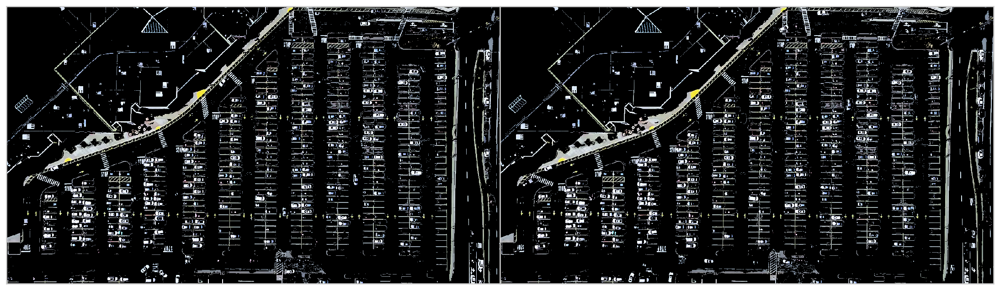

In [51]:
def select_rgb_white_yellow(image): 
    # white color mask
    lower = np.uint8([120, 120, 120])
    upper = np.uint8([255, 255, 255])
    white_mask = cv2.inRange(image, lower, upper)
    # yellow color mask
    lower = np.uint8([190, 190,   0])
    upper = np.uint8([255, 255, 255])
    yellow_mask = cv2.inRange(image, lower, upper)
    # combine the mask
    mask = cv2.bitwise_or(white_mask, yellow_mask)
    masked = cv2.bitwise_and(image, image, mask = mask)
    return masked

white_yellow_images = list(map(select_rgb_white_yellow, test_images))
show_images(white_yellow_images)

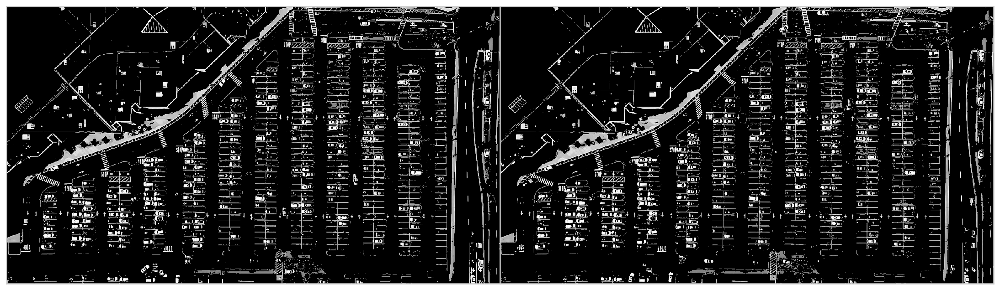

In [52]:
def convert_gray_scale(image):
    return cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

gray_images = list(map(convert_gray_scale, white_yellow_images))

show_images(gray_images)

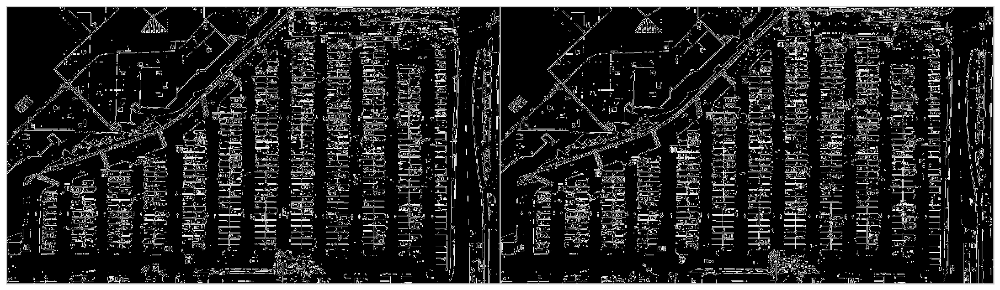

In [55]:
def detect_edges(image, low_threshold=50, high_threshold=200):
    return cv2.Canny(image, low_threshold, high_threshold)

edge_images = list(map(lambda image: detect_edges(image), gray_images))

show_images(edge_images)

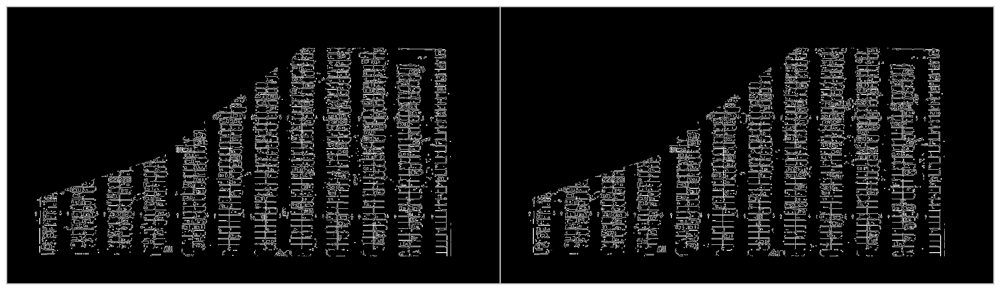

In [56]:
def filter_region(image, vertices):
    """
    Create the mask using the vertices and apply it to the input image
    """
    mask = np.zeros_like(image)
    if len(mask.shape)==2:
        cv2.fillPoly(mask, vertices, 255)
    else:
        cv2.fillPoly(mask, vertices, (255,)*mask.shape[2]) # in case, the input image has a channel dimension        
    return cv2.bitwise_and(image, mask)

    
def select_region(image):
    """
    It keeps the region surrounded by the `vertices` (i.e. polygon).  Other area is set to 0 (black).
    """
    # first, define the polygon by vertices
    rows, cols = image.shape[:2]
    pt_1  = [cols*0.05, rows*0.90]
    pt_2 = [cols*0.05, rows*0.70]
    pt_3 = [cols*0.30, rows*0.55]
    pt_4 = [cols*0.6, rows*0.15]
    pt_5 = [cols*0.90, rows*0.15] 
    pt_6 = [cols*0.90, rows*0.90]
    # the vertices are an array of polygons (i.e array of arrays) and the data type must be integer
    vertices = np.array([[pt_1, pt_2, pt_3, pt_4, pt_5, pt_6]], dtype=np.int32)
    return filter_region(image, vertices)


# images showing the region of interest only
roi_images = list(map(select_region, edge_images))

show_images(roi_images)

In [57]:
def hough_lines(image):
    """
    `image` should be the output of a Canny transform.
    
    Returns hough lines (not the image with lines)
    """
    return cv2.HoughLinesP(image, rho=0.1, theta=np.pi/10, threshold=15, minLineLength=9, maxLineGap=4)


list_of_lines = list(map(hough_lines, roi_images))

 No lines detected:  569
 No lines detected:  588


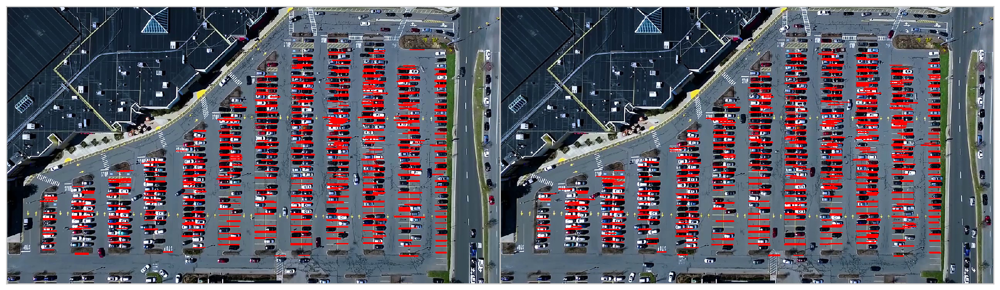

In [58]:
def draw_lines(image, lines, color=[255, 0, 0], thickness=2, make_copy=True):
    # the lines returned by cv2.HoughLinesP has the shape (-1, 1, 4)
    if make_copy:
        image = np.copy(image) # don't want to modify the original
    cleaned = []
    for line in lines:
        for x1,y1,x2,y2 in line:
            if abs(y2-y1) <=1 and abs(x2-x1) >=25 and abs(x2-x1) <= 55:
                cleaned.append((x1,y1,x2,y2))
                cv2.line(image, (x1, y1), (x2, y2), color, thickness)
    print(" No lines detected: ", len(cleaned))
    return image


line_images = []
for image, lines in zip(test_images, list_of_lines):
    line_images.append(draw_lines(image, lines))
    
show_images(line_images)

Num Parking Lanes:  12
Num Parking Lanes:  12


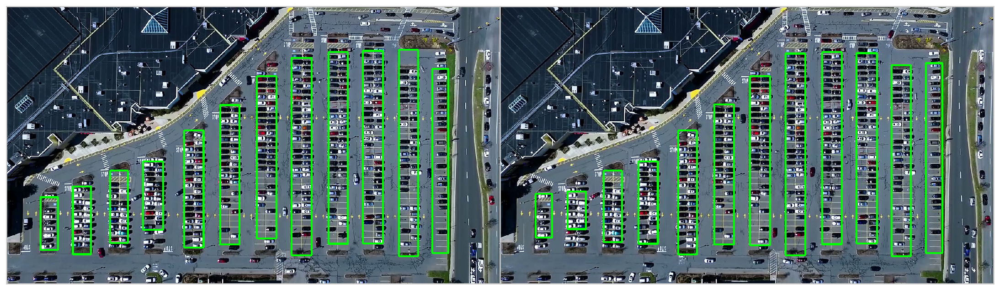

In [59]:
def identify_blocks(image, lines, make_copy=True):
    if make_copy:
        new_image = np.copy(image)
    #Step 1: Create a clean list of lines
    cleaned = []
    for line in lines:
        for x1,y1,x2,y2 in line:
            if abs(y2-y1) <=1 and abs(x2-x1) >=25 and abs(x2-x1) <= 55:
                cleaned.append((x1,y1,x2,y2))
    
    #Step 2: Sort cleaned by x1 position
    import operator
    list1 = sorted(cleaned, key=operator.itemgetter(0, 1))
    
    #Step 3: Find clusters of x1 close together - clust_dist apart
    clusters = {}
    dIndex = 0
    clus_dist = 10

    for i in range(len(list1) - 1):
        distance = abs(list1[i+1][0] - list1[i][0])
    #         print(distance)
        if distance <= clus_dist:
            if not dIndex in clusters.keys(): clusters[dIndex] = []
            clusters[dIndex].append(list1[i])
            clusters[dIndex].append(list1[i + 1])

        else:
            dIndex += 1
    
    #Step 4: Identify coordinates of rectangle around this cluster
    rects = {}
    i = 0
    for key in clusters:
        all_list = clusters[key]
        cleaned = list(set(all_list))
        if len(cleaned) > 5:
            cleaned = sorted(cleaned, key=lambda tup: tup[1])
            avg_y1 = cleaned[0][1]
            avg_y2 = cleaned[-1][1]
    #         print(avg_y1, avg_y2)
            avg_x1 = 0
            avg_x2 = 0
            for tup in cleaned:
                avg_x1 += tup[0]
                avg_x2 += tup[2]
            avg_x1 = avg_x1/len(cleaned)
            avg_x2 = avg_x2/len(cleaned)
            rects[i] = (avg_x1, avg_y1, avg_x2, avg_y2)
            i += 1
    
    print("Num Parking Lanes: ", len(rects))
    #Step 5: Draw the rectangles on the image
    buff = 7
    for key in rects:
        tup_topLeft = (int(rects[key][0] - buff), int(rects[key][1]))
        tup_botRight = (int(rects[key][2] + buff), int(rects[key][3]))
#         print(tup_topLeft, tup_botRight)
        cv2.rectangle(new_image, tup_topLeft,tup_botRight,(0,255,0),3)
    return new_image, rects

# images showing the region of interest only
rect_images = []
rect_coords = []
for image, lines in zip(test_images, list_of_lines):
    new_image, rects = identify_blocks(image, lines)
    rect_images.append(new_image)
    rect_coords.append(rects)
    
show_images(rect_images)

0
1
2
3
4
5
6
7
8
9
10
11
total parking spaces:  551 550
0
1
2
3
4
5
6
7
8
9
10
11
total parking spaces:  545 544


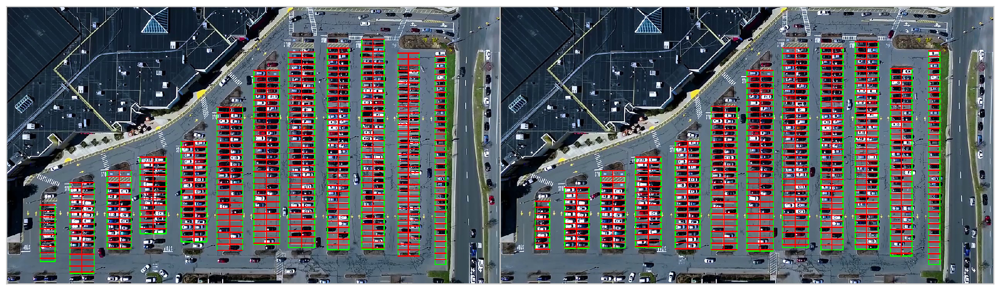

In [60]:
def draw_parking(image, rects, make_copy = True, color=[255, 0, 0], thickness=2, save = True):
    if make_copy:
        new_image = np.copy(image)
    gap = 15.5
    spot_dict = {} # maps each parking ID to its coords
    tot_spots = 0
    adj_y1 = {0: 20, 1:-10, 2:0, 3:-11, 4:28, 5:5, 6:-15, 7:-15, 8:-10, 9:-30, 10:9, 11:-32}
    adj_y2 = {0: 30, 1: 50, 2:15, 3:10, 4:-15, 5:15, 6:15, 7:-20, 8:15, 9:15, 10:0, 11:30}
    
    adj_x1 = {0: -8, 1:-15, 2:-15, 3:-15, 4:-15, 5:-15, 6:-15, 7:-15, 8:-10, 9:-10, 10:-10, 11:0}
    adj_x2 = {0: 0, 1: 15, 2:15, 3:15, 4:15, 5:15, 6:15, 7:15, 8:10, 9:10, 10:10, 11:0}
    for key in rects:
        # Horizontal lines
        print(key)
        tup = rects[key]
        x1 = int(tup[0]+ adj_x1[key])
        x2 = int(tup[2]+ adj_x2[key])
        y1 = int(tup[1] + adj_y1[key])
        y2 = int(tup[3] + adj_y2[key])
        cv2.rectangle(new_image, (x1, y1),(x2,y2),(0,255,0),2)
        num_splits = int(abs(y2-y1)//gap)
        for i in range(0, num_splits+1):
            y = int(y1 + i*gap)
            cv2.line(new_image, (x1, y), (x2, y), color, thickness)
        if key > 0 and key < len(rects) -1 :        
            #draw vertical lines
            x = int((x1 + x2)/2)
            cv2.line(new_image, (x, y1), (x, y2), color, thickness)
        # Add up spots in this lane
        if key == 0 or key == (len(rects) -1):
            tot_spots += num_splits +1
        else:
            tot_spots += 2*(num_splits +1)
            
        # Dictionary of spot positions
        if key == 0 or key == (len(rects) -1):
            for i in range(0, num_splits+1):
                cur_len = len(spot_dict)
                y = int(y1 + i*gap)
                spot_dict[(x1, y, x2, y+gap)] = cur_len +1        
        else:
            for i in range(0, num_splits+1):
                cur_len = len(spot_dict)
                y = int(y1 + i*gap)
                x = int((x1 + x2)/2)
                spot_dict[(x1, y, x, y+gap)] = cur_len +1
                spot_dict[(x, y, x2, y+gap)] = cur_len +2   
    
    print("total parking spaces: ", tot_spots, cur_len)
    if save:
        filename = 'with_parking.jpg'
        cv2.imwrite(filename, new_image)
    return new_image, spot_dict

delineated = []
spot_pos = []
for image, rects in zip(test_images, rect_coords):
    new_image, spot_dict = draw_parking(image, rects)
    delineated.append(new_image)
    spot_pos.append(spot_dict)
    
show_images(delineated)

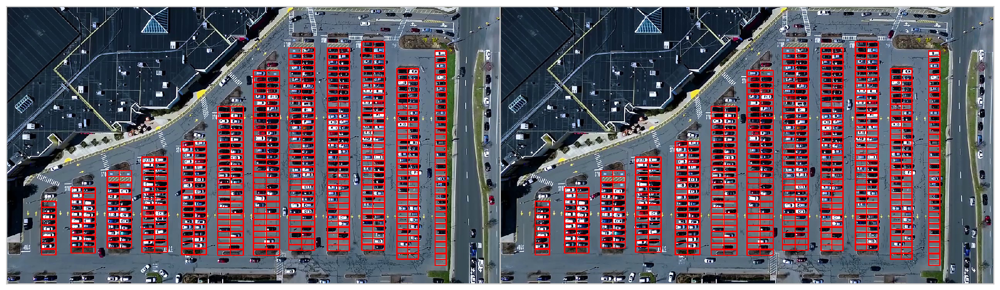

In [61]:
final_spot_dict = spot_pos[1]
def assign_spots_map(image, spot_dict=final_spot_dict, make_copy = True, color=[255, 0, 0], thickness=2):
    if make_copy:
        new_image = np.copy(image)
    for spot in spot_dict.keys():
        (x1, y1, x2, y2) = spot
        cv2.rectangle(new_image, (int(x1),int(y1)), (int(x2),int(y2)), color, thickness)
    return new_image

marked_spot_images = list(map(assign_spots_map, test_images))
show_images(marked_spot_images)

In [62]:
cwd = os.getcwd()
top_model_weights_path = 'car1.h5'

class_dictionary = {}
class_dictionary[0] = 'empty'
class_dictionary[1] = 'occupied'

In [63]:
def make_prediction(image):
    #Rescale image
    img = image/255.
    img
    #Convert to a 4D tensor
    image = np.expand_dims(img, axis=0)
#     print(image.shape)

    # make predictions on the preloaded model
    class_predicted = model.predict(image)
    inID = np.argmax(class_predicted[0])
    label = class_dictionary[inID]
    return label

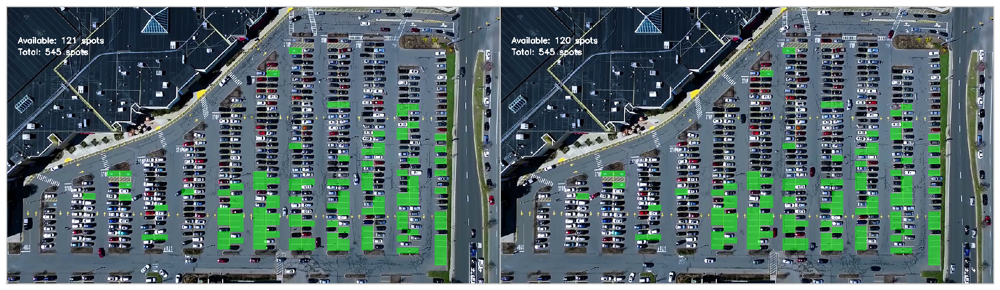

In [64]:
def predict_on_image(image, spot_dict = final_spot_dict, make_copy=True, color = [0, 255, 0], alpha=0.5):
    if make_copy:
        new_image = np.copy(image)
        overlay = np.copy(image)
    cnt_empty = 0
    all_spots = 0
    for spot in spot_dict.keys():
        all_spots += 1
        (x1, y1, x2, y2) = spot
        (x1, y1, x2, y2) = (int(x1), int(y1), int(x2), int(y2))
        #crop this image
        spot_img = image[y1:y2, x1:x2]
        spot_img = cv2.resize(spot_img, (48, 48)) 
        
        label = make_prediction(spot_img)
#         print(label)
        if label == 'empty':
            cv2.rectangle(overlay, (int(x1),int(y1)), (int(x2),int(y2)), color, -1)
            cnt_empty += 1
            
    cv2.addWeighted(overlay, alpha, new_image, 1 - alpha, 0, new_image)
            
    cv2.putText(new_image, "Available: %d spots" %cnt_empty, (30, 95),
    cv2.FONT_HERSHEY_SIMPLEX,
    0.7, (255, 255, 255), 2)
    
    cv2.putText(new_image, "Total: %d spots" %all_spots, (30, 125),
    cv2.FONT_HERSHEY_SIMPLEX,
    0.7, (255, 255, 255), 2)
    save = False
    
    if save:
        filename = 'with_marking.jpg'
        cv2.imwrite(filename, new_image)
    
    return new_image


predicted_images = list(map(predict_on_image, test_images))
show_images(predicted_images)